# Персональный топ

In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import tqdm
import re
from lightfm import LightFM
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.cluster import KMeans, k_means
from sklearn.metrics import silhouette_score
from sklearn.datasets.samples_generator import make_blobs 
from tqdm import tqdm_notebook
import collections

In [2]:
books = pd.read_csv("BX-Books.csv")
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")
interactions = interactions[interactions["Book-Rating"] != 0]
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])
users.fillna(users['Age'].median(), inplace=True)

In [3]:
interactions

,User-ID,ISBN,Book-Rating,user_num,books_num,picture_url,Book-Title,product_id,vid
0,86583,3404139178,9,8,18,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,3445
1,132500,3404139178,10,8,43,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,5248
2,66483,3404139178,10,8,83,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,2622
3,276866,3404139178,9,8,11,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,10887
4,106534,3404139178,6,8,6,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,4228
...,...,...,...,...,...,...,...,...,...
110514,27551,0849912970,10,6,6,http://images.amazon.com/images/P/0849912970.0...,Traveling Light: Releasing the Burdens You Wer...,9478,1035
110515,206652,1860465811,9,8,10,http://images.amazon.com/images/P/1860465811.0...,Wind-Up Bird Chronicle,10209,8112
110516,223525,1588720284,8,6,13,http://images.amazon.com/images/P/1588720284.0...,Why Your Life Sucks: And What You Can Do Abou...,10138,8754
110517,94153,0060652926,9,7,14,http://images.amazon.com/images/P/0060652926.0...,Mere Christianity,276,3740


In [4]:
users

,User-ID,Location,Age
0,1,"nyc, new york, usa",32.0
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",32.0
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",32.0
...,...,...,...
278853,278854,"portland, oregon, usa",32.0
278854,278855,"tacoma, washington, united kingdom",50.0
278855,278856,"brampton, ontario, canada",32.0
278856,278857,"knoxville, tennessee, usa",32.0


In [5]:
def find(age, location):
    if age<21 and ' usa' in location:
        return 0
    if age>=21 and age<=55 and ' usa' in location:
        return 1
    if age>55 and ' usa' in location:
        return 2
    if age<21 and ' usa' not in location:
        return 3
    if age>=21 and age<=55 and ' usa' not in location:
        return 4
    if age>55 and ' usa' not in location:
        return 5
    else:
        print(age)
        print(location)

In [6]:
usid_age=dict()
usid_loc=dict()
for i in tqdm_notebook(range(0,len(users['User-ID']))):
    usid_age[users.iloc[i]['User-ID']]=users.iloc[i]['Age']
    usid_loc[users.iloc[i]['User-ID']]=users.iloc[i]['Location']

In [7]:
user_age=dict()
user_loc=dict()
user_clust=dict()
for i in tqdm_notebook(range(0,len(interactions['vid']))):
    user_age[interactions.iloc[i]['vid']]=usid_age[interactions.iloc[i]['User-ID']]
    user_loc[interactions.iloc[i]['vid']]=usid_loc[interactions.iloc[i]['User-ID']]
    user_clust[interactions.iloc[i]['vid']]=find(user_age[interactions.iloc[i]['vid']],user_loc[interactions.iloc[i]['vid']])
clust_sizes=[0,0,0,0,0,0]
for i in tqdm_notebook(range(0,len(user_age))):
    clust_sizes[find(user_age[i],user_loc[i])]+=1

In [8]:
prod_pic=dict()
prod_name=dict()
element=dict()
marks=dict()
num_clust=6
for i in range(0,num_clust):
    element['C{}'.format(i)]=0
    element['C_num{}'.format(i)]=0
    element['Cmark{}'.format(i)]=0
for i in tqdm_notebook(range(0,len(interactions['product_id']))):
    prod_pic[interactions.iloc[i]['product_id']]=interactions.iloc[i]['picture_url']
    prod_name[interactions.iloc[i]['product_id']]=interactions.iloc[i]['Book-Title']
    marks[interactions.iloc[i]['product_id']]=element.copy()
for i in tqdm_notebook(range(0,len(interactions['product_id']))):
    marks[interactions.iloc[i]['product_id']]['C_num{}'.format(user_clust[interactions.iloc[i]['vid']])]+=1
    marks[interactions.iloc[i]['product_id']]['C{}'.format(user_clust[interactions.iloc[i]['vid']])]+=interactions.iloc[i]['Book-Rating']
for i in tqdm_notebook(range(0,len(prod_name))):
    for j in range(0,num_clust):
       if marks[i]['C_num{}'.format(j)]!=0:
          marks[i]['Cmark{}'.format(j)]= marks[i]['C{}'.format(j)]/clust_sizes[j]

In [9]:
columns_names=['product_id','picture_url','Book-Title']
for i in range(0,num_clust):
    columns_names.append('Cmark{}'.format(i))
BOOK = pd.DataFrame(columns=columns_names)
for i in tqdm_notebook(range(0,len(prod_pic))):
    temp=dict()
    temp['product_id']=i
    temp['picture_url']=prod_pic[i]
    temp['Book-Title']=prod_name[i]
    for  j in range(0,num_clust):
        temp['Cmark{}'.format(j)]=marks[i]['Cmark{}'.format(j)]
    BOOK.loc[i]=temp

In [10]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict,name_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    names = [name_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("{} \nmeasure = {}".format(names[cnt][0:20],np.round(measure[cnt], 4)))
                cnt += 1
            else:
                a.title.set_text("{}".format(names[cnt][0:20]))
            plt.imshow(im)
            plt.axis('off')
        plt.show()

Cluster 0


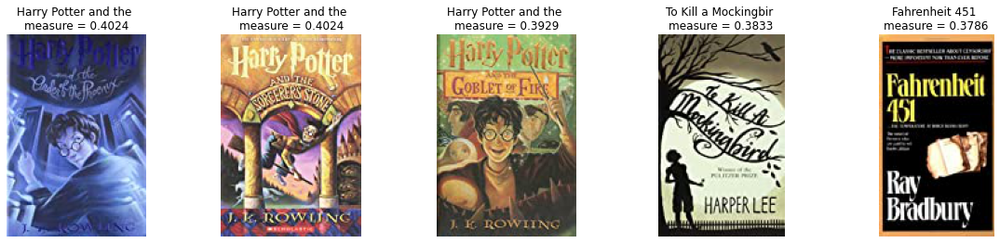

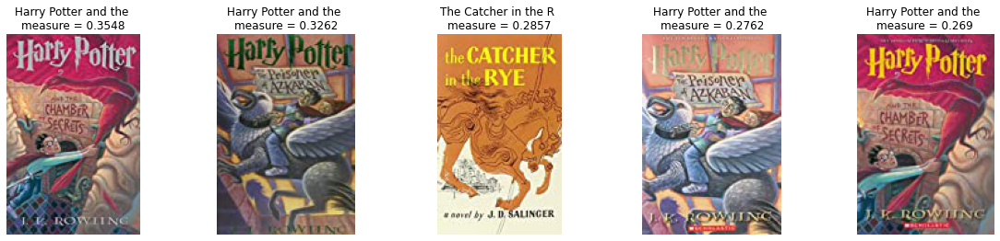

Cluster 1


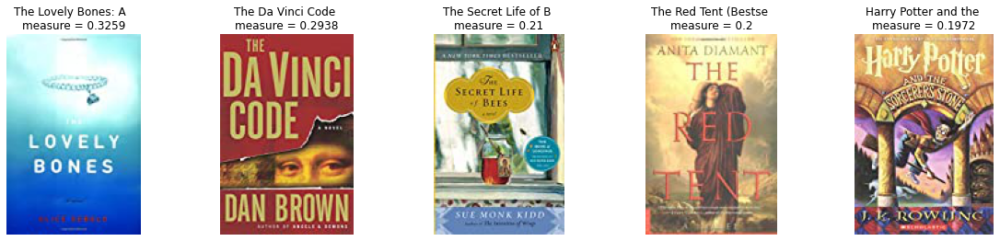

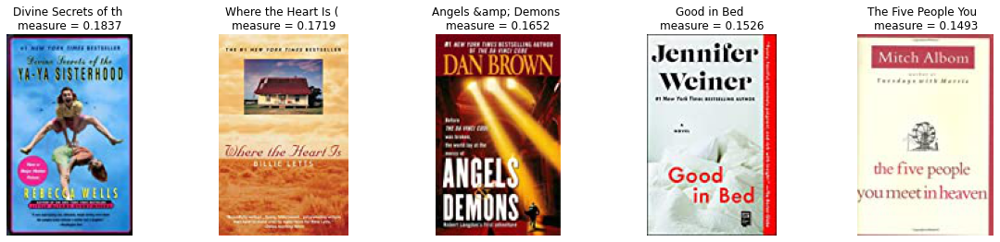

Cluster 2


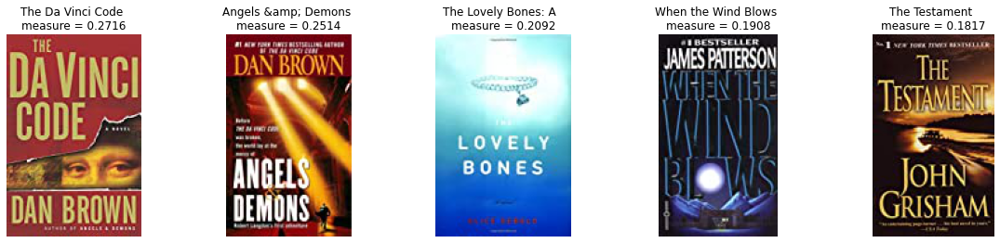

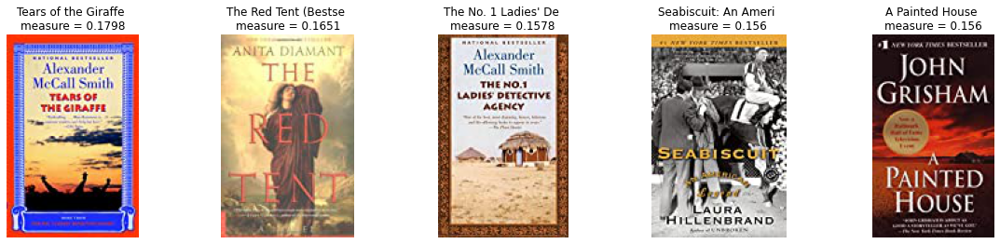

Cluster 3


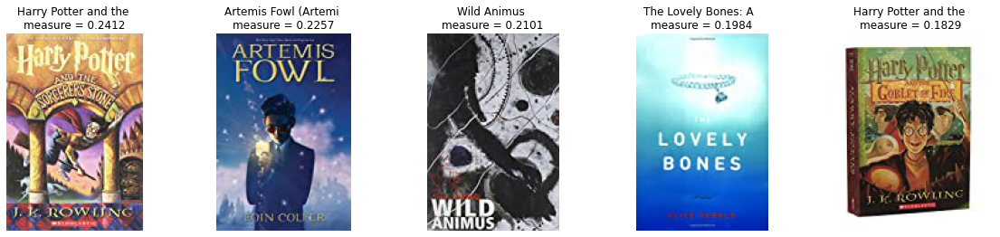

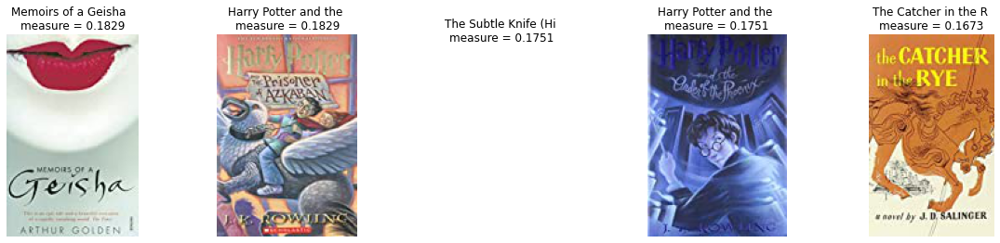

Cluster 4


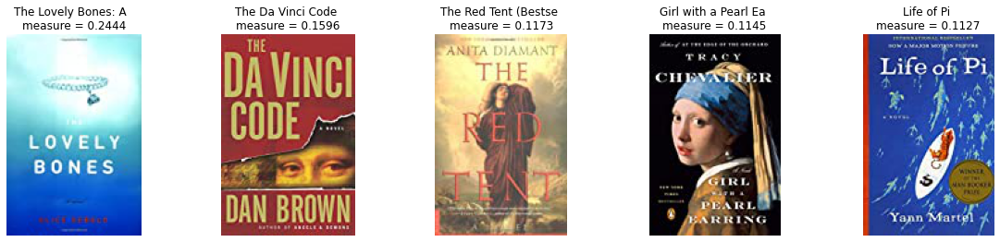

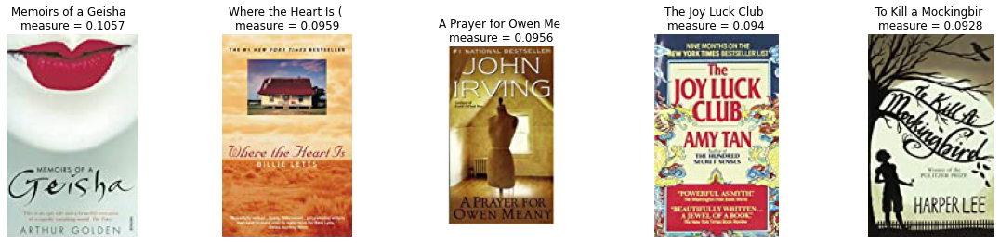

Cluster 5


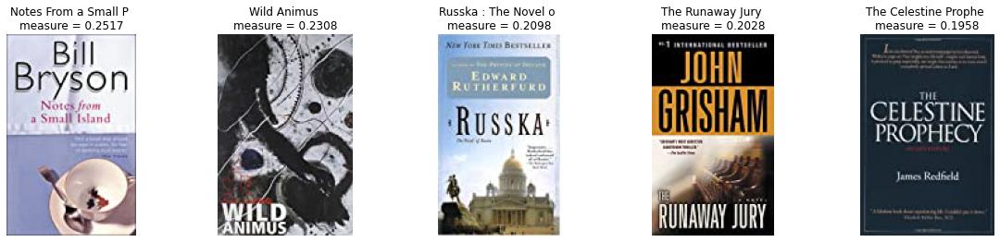

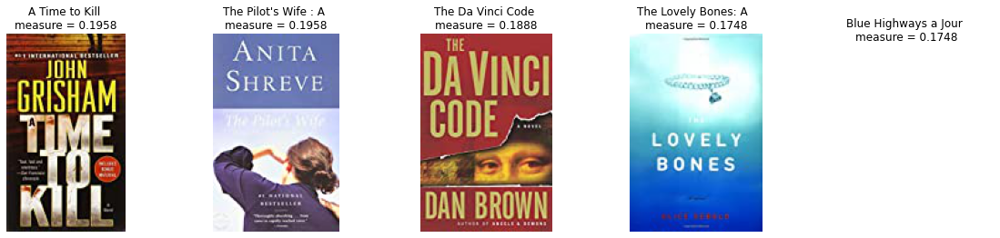

In [11]:
for i in range(0,num_clust):
   clustpd=BOOK.sort_values(by=['Cmark{}'.format(i)], ascending=False).reset_index(drop=True)
   product_top=[]
   mark_top=[]
   for j in range(0,10):
      product_top.append(clustpd.iloc[j]['product_id'])
      mark_top.append(clustpd.iloc[j]['Cmark{}'.format(i)])
   print("Cluster {}".format(i))
   rec_imaging(product_top,prod_pic,prod_name,mark_top)

In [12]:
def recommend(age, location):
    i=find(age,location)
    clustpd=BOOK.sort_values(by=['Cmark{}'.format(i)], ascending=False).reset_index(drop=True)
    product_top=[]
    mark_top=[]
    for j in range(0,10):
       product_top.append(clustpd.iloc[j]['product_id'])
       mark_top.append(clustpd.iloc[j]['Cmark{}'.format(i)])
    print("age: ",age)
    print("location: ",location)
    rec_imaging(product_top,prod_pic,prod_name,mark_top)

age:  18
location:  russia


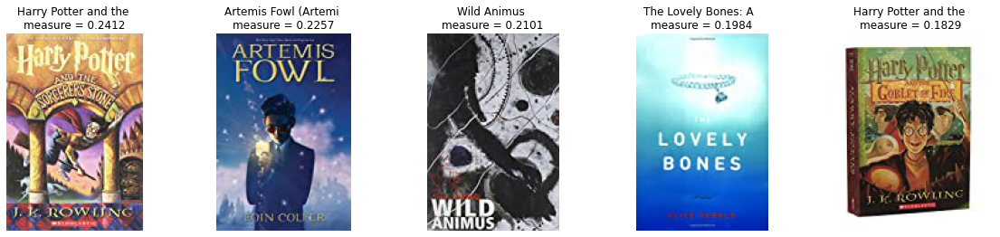

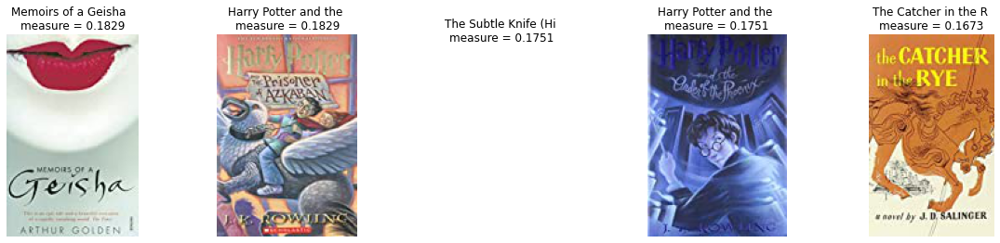

In [13]:
recommend(18,'russia')

age:  45
location:   usa


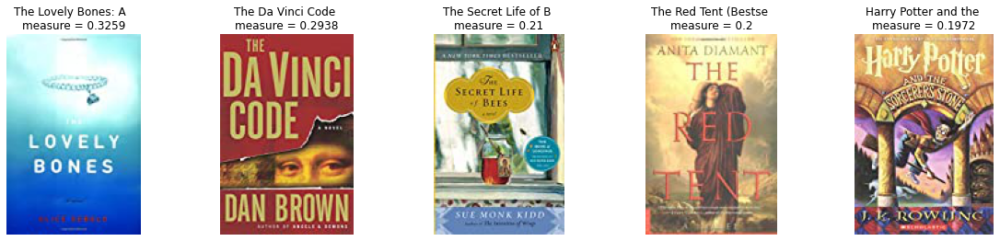

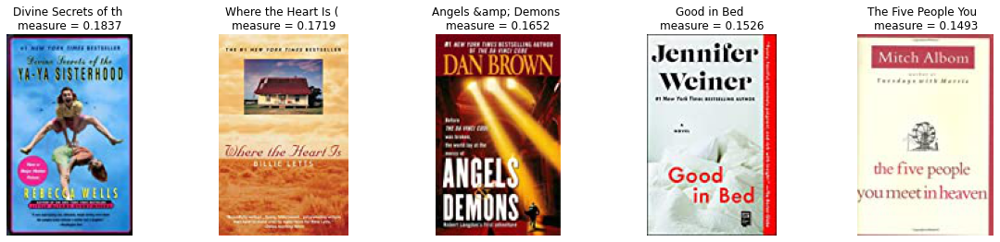

In [14]:
recommend(45, ' usa')

# Кластеризация похожих пользователей

In [15]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import tqdm
import re
from lightfm import LightFM
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.cluster import KMeans, k_means
from sklearn.metrics import silhouette_score
from sklearn.datasets.samples_generator import make_blobs 
from tqdm import tqdm_notebook
import collections

In [16]:
books = pd.read_csv("BX-Books.csv")
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")
interactions = interactions[interactions["Book-Rating"] != 0]
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])
users.fillna(users['Age'].median(), inplace=True)

In [17]:
interactions

,User-ID,ISBN,Book-Rating,user_num,books_num,picture_url,Book-Title,product_id,vid
0,86583,3404139178,9,8,18,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,3445
1,132500,3404139178,10,8,43,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,5248
2,66483,3404139178,10,8,83,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,2622
3,276866,3404139178,9,8,11,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,10887
4,106534,3404139178,6,8,6,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,4228
...,...,...,...,...,...,...,...,...,...
110514,27551,0849912970,10,6,6,http://images.amazon.com/images/P/0849912970.0...,Traveling Light: Releasing the Burdens You Wer...,9478,1035
110515,206652,1860465811,9,8,10,http://images.amazon.com/images/P/1860465811.0...,Wind-Up Bird Chronicle,10209,8112
110516,223525,1588720284,8,6,13,http://images.amazon.com/images/P/1588720284.0...,Why Your Life Sucks: And What You Can Do Abou...,10138,8754
110517,94153,0060652926,9,7,14,http://images.amazon.com/images/P/0060652926.0...,Mere Christianity,276,3740


In [18]:
df_weights = pd.DataFrame({"Book-Rating": [1,2,3,4,5,6,7,8,9,10],
                                   'weight': [1,2,3,4,5,6,7,8,9,10]})
weighted = interactions.merge(df_weights, on="Book-Rating")\
                          .groupby(["vid", "product_id", "picture_url"])["weight"]\
                          .sum()\
                          .reset_index()
csr_rates = coo_matrix((weighted["weight"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"]))))

In [19]:
weighted

,vid,product_id,picture_url,weight
0,0,0,http://images.amazon.com/images/P/0002005018.0...,5
1,1,1386,http://images.amazon.com/images/P/0312252617.0...,8
2,1,1393,http://images.amazon.com/images/P/0312261594.0...,8
3,1,1710,http://images.amazon.com/images/P/0316748641.0...,7
4,1,5105,http://images.amazon.com/images/P/0446677450.0...,10
...,...,...,...,...
110514,10958,9663,http://images.amazon.com/images/P/0894803700.0...,5
110515,10958,9907,http://images.amazon.com/images/P/1558531025.0...,8
110516,10959,2647,http://images.amazon.com/images/P/0375703063.0...,7
110517,10959,4019,http://images.amazon.com/images/P/042516098X.0...,7


In [20]:
num_clust=3
kmeans=KMeans(init='random',n_clusters=num_clust,random_state=28)
kmeans.fit(csr_rates)
labels=kmeans.labels_
weighted = weighted.assign(Cluster=pd.Series(labels))

In [21]:
collections.Counter(labels)
clust_size=[]
for i in range(0,num_clust):
    clust_size.append(collections.Counter(labels)[i])

In [22]:
user_clust=dict()
prod_pic=dict()
prod_name=dict()
element=dict()
marks=dict()
for i in range(0,num_clust):
    element['C{}'.format(i)]=0
    element['C_num{}'.format(i)]=0
    element['Cmark{}'.format(i)]=0
mvid=max(weighted['vid'])
for i in tqdm_notebook(range(0,mvid+1)):
    user_clust[i]=labels[i]
for i in tqdm_notebook(range(0,len(interactions['product_id']))):
    prod_pic[interactions.iloc[i]['product_id']]=interactions.iloc[i]['picture_url']
    prod_name[interactions.iloc[i]['product_id']]=interactions.iloc[i]['Book-Title']
    marks[interactions.iloc[i]['product_id']]=element.copy()
for i in tqdm_notebook(range(0,len(interactions['product_id']))):
    marks[interactions.iloc[i]['product_id']]['C_num{}'.format(user_clust[interactions.iloc[i]['vid']])]+=1
    marks[interactions.iloc[i]['product_id']]['C{}'.format(user_clust[interactions.iloc[i]['vid']])]+=interactions.iloc[i]['Book-Rating']
for i in tqdm_notebook(range(0,len(prod_name))):
    for j in range(0,num_clust):
       if marks[i]['C_num{}'.format(j)]!=0:
          marks[i]['Cmark{}'.format(j)]= marks[i]['C{}'.format(j)]/clust_size[j]

In [23]:
columns_names=['product_id','picture_url','Book-Title']
for i in range(0,num_clust):
    columns_names.append('Cmark{}'.format(i))
BOOK = pd.DataFrame(columns=columns_names)
for i in tqdm_notebook(range(0,len(prod_pic))):
    temp=dict()
    temp['product_id']=i
    temp['picture_url']=prod_pic[i]
    temp['Book-Title']=prod_name[i]
    for  j in range(0,num_clust):
        temp['Cmark{}'.format(j)]=marks[i]['Cmark{}'.format(j)]
    BOOK.loc[i]=temp

In [24]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict,name_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    names = [name_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("{} \nmeasure = {}".format(names[cnt][0:20],np.round(measure[cnt], 4)))
                cnt += 1
            else:
                a.title.set_text("{}".format(names[cnt][0:20]))
            plt.imshow(im)
            plt.axis('off')
        plt.show()

Cluster 0


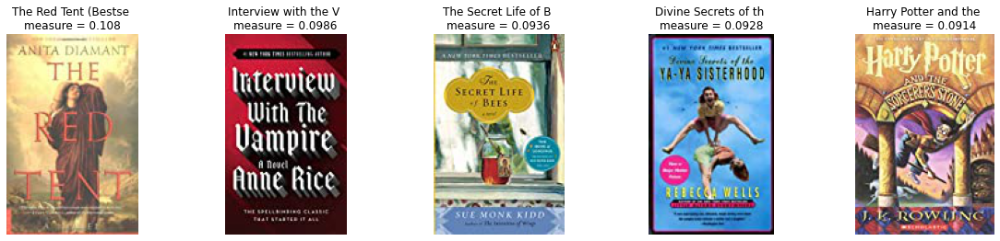

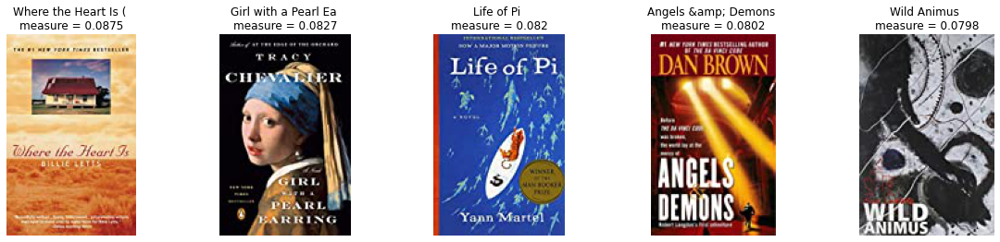

Cluster 1


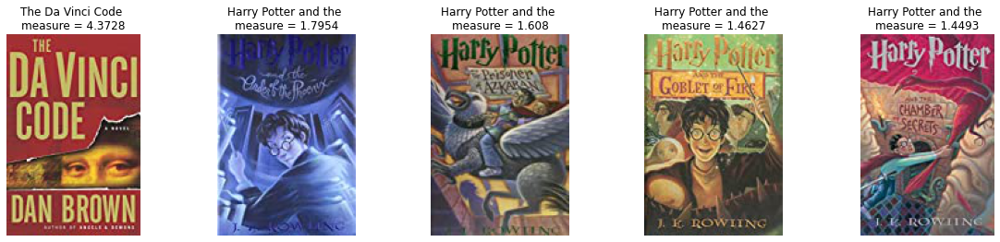

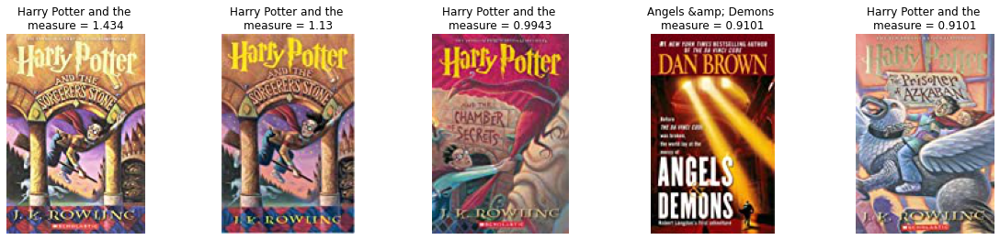

Cluster 2


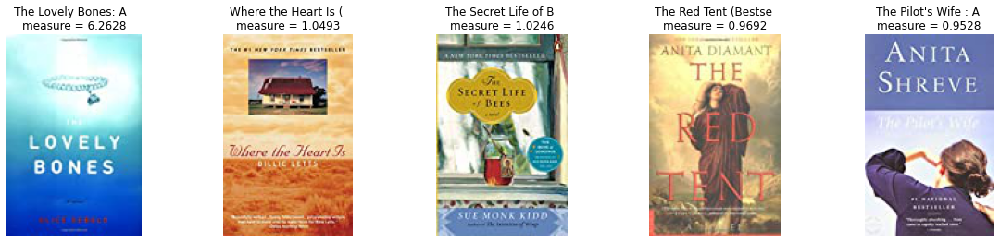

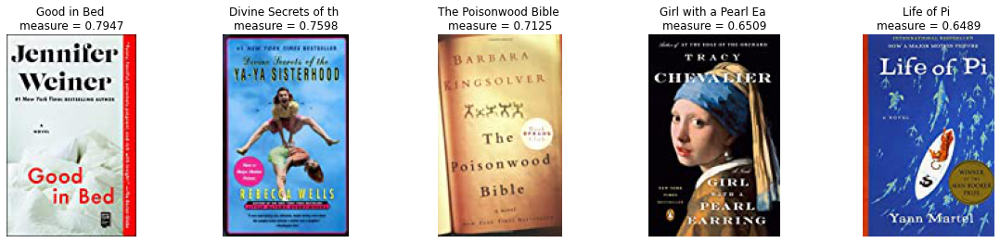

In [25]:
for i in range(0,num_clust):
   clustpd=BOOK.sort_values(by=['Cmark{}'.format(i)], ascending=False).reset_index(drop=True)
   product_top=[]
   mark_top=[]
   for j in range(0,10):
      product_top.append(clustpd.iloc[j]['product_id'])
      mark_top.append(clustpd.iloc[j]['Cmark{}'.format(i)])
   print("Cluster {}".format(i))
   rec_imaging(product_top,prod_pic,prod_name,mark_top)

In [26]:
def recommend(user):
    i=user_clust[user]
    clustpd=BOOK.sort_values(by=['Cmark{}'.format(i)], ascending=False).reset_index(drop=True)
    product_top=[]
    mark_top=[]
    for j in range(0,10):
       product_top.append(clustpd.iloc[j]['product_id'])
       mark_top.append(clustpd.iloc[j]['Cmark{}'.format(i)])
    print("vid: ",user)
    rec_imaging(product_top,prod_pic,prod_name,mark_top)

vid:  100


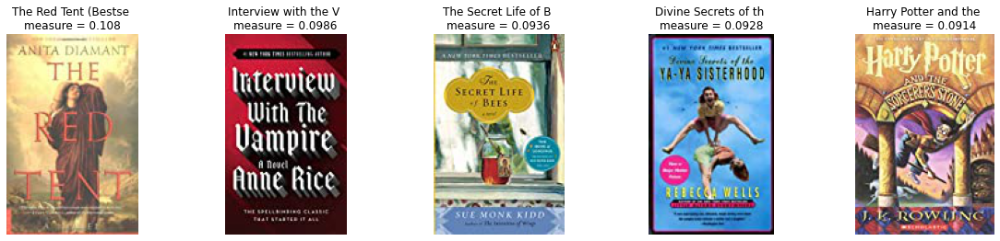

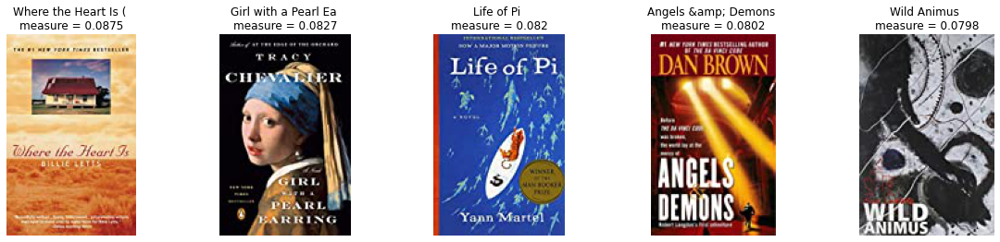

In [27]:
recommend(100)

In [28]:
for i, j in interactions[["product_id", "Book-Title"]].drop_duplicates().values:
    if "Harry Potter" in j:
        print("idx:", i, "\tBook Title:", j)

idx: 4233 	Book Title: Harry Potter and the Order of the Phoenix (Book 5)
idx: 7036 	Book Title: Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))
idx: 4216 	Book Title: Harry Potter and the Chamber of Secrets (Book 2)
idx: 4226 	Book Title: Harry Potter and the Goblet of Fire (Book 4)
idx: 7035 	Book Title: Harry Potter and the Sorcerer's Stone (Book 1)
idx: 4238 	Book Title: Harry Potter and the Chamber of Secrets Postcard Book
idx: 4224 	Book Title: Harry Potter and the Prisoner of Azkaban (Book 3)
idx: 4227 	Book Title: Harry Potter and the Goblet of Fire (Book 4)
idx: 4217 	Book Title: Harry Potter and the Chamber of Secrets (Book 2)
idx: 4225 	Book Title: Harry Potter and the Prisoner of Azkaban (Book 3)
idx: 8836 	Book Title: The Sorcerer's Companion: A Guide to the Magical World of Harry Potter
idx: 9732 	Book Title: Ultimate Unofficial Guide to the Mysteries of Harry Potter
idx: 4234 	Book Title: Harry Potter and the Sorcerer's Stone (Book 1)
idx: 10280 	Book Ti

In [29]:
for i, j in interactions[["product_id", "Book-Title"]].drop_duplicates().values:
    if "The Lord of the Rings" in j:
        print("idx:", i, "\tBook Title:", j)

idx: 1921 	Book Title: The Hobbit : The Enchanting Prelude to The Lord of the Rings
idx: 7164 	Book Title: The Fellowship of the Ring (The Lord of the Rings, Part 1)
idx: 7165 	Book Title: The Two Towers (The Lord of the Rings, Part 2)
idx: 1923 	Book Title: The Two Towers (The Lord of the Rings, Part 2)
idx: 1924 	Book Title: The Return of the King (The Lord of the Rings, Part 3)
idx: 7184 	Book Title: The Lord of the Rings
idx: 1922 	Book Title: The Fellowship of the Ring (The Lord of the Rings, Part 1)
idx: 1927 	Book Title: The Hobbit and The Lord of the Rings
idx: 7172 	Book Title: The Lord of the Rings (Movie Art Cover)
idx: 7173 	Book Title: The Fellowship of the Ring (The Lord of the Rings, Part 1)
idx: 7174 	Book Title: The Two Towers (The Lord of the Rings, Part 2)
idx: 3618 	Book Title: The Lord of the Rings (Leatherette Collector's Edition)


# Совстречаемость

In [30]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import tqdm
import re
from lightfm import LightFM
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds

In [31]:
books = pd.read_csv("BX-Books.csv")
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")
interactions = interactions[interactions["Book-Rating"] != 0]
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])

In [32]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i[0])
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i[0]))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("{} \n measure = {}".format(i[1],np.round(measure[cnt], 4)))
                cnt += 1
            else:
                a.title.set_text("{}".format(i[1]))
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [33]:
class Recomendations():
    def __init__(self, Int):
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url","Book-Title"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = [i[1],i[2]]
        self.interactions = Int
        
    def coocurrency_count(self):
        Int = self.interactions
        user_products = Int.groupby(["vid"])["product_id"].apply(list).reset_index()
        user_ratings = Int.groupby(["vid"])["Book-Rating"].apply(list).reset_index()
        user_products= user_products.merge(user_ratings, on=["vid"])
        product_num = [len(i) for i in user_products["product_id"]]
        user_products["prod_num"] = product_num
        user_products = user_products[user_products["prod_num"] > 1]
        cooc = {}
        for i in tqdm.tqdm_notebook(user_products.values):
           for j in range(len(i[1])):
              for k in range(len(i[1])):
                 if j != k:
                    try:
                       cooc[str(i[1][j]) + "_" + str(i[1][k])][0] += 1
                       cooc[str(i[1][j]) + "_" + str(i[1][k])][1] += ((i[2][j]+i[2][k])/2)
                    except:
                       cooc[str(i[1][j]) + "_" + str(i[1][k])] = [1,(i[2][j]+i[2][k])/2]
        cooc_list = []
        for i, j in cooc.items():
           if j[0] != 1:
              cooc_list.append(i.split("_") + [j[1]])

        self.cooc_rec = pd.DataFrame(cooc_list, columns=["item1", "item2", "measure"])
    
    def get_rec(self, i, show=False):
        recs = self.cooc_rec[self.cooc_rec["item1"] == str(i)]\
                            .sort_values("measure", ascending=False)\
                            .head(10)
        print(u"Для книги")
        rec_imaging([i], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging(recs["item2"].values.astype(int), self.product_id_to_url, 
                         recs["measure"].values.astype(int))

In [34]:
cooc_rec = Recomendations(interactions)
cooc_rec.coocurrency_count()

Для книги


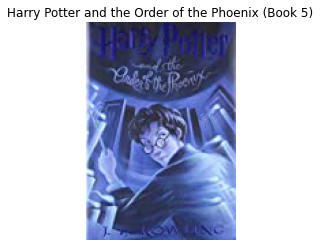

Такие рекомендации


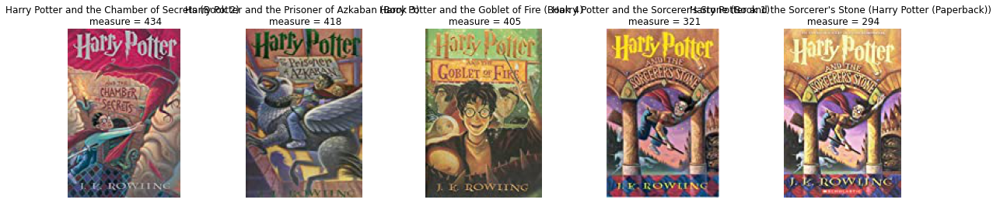

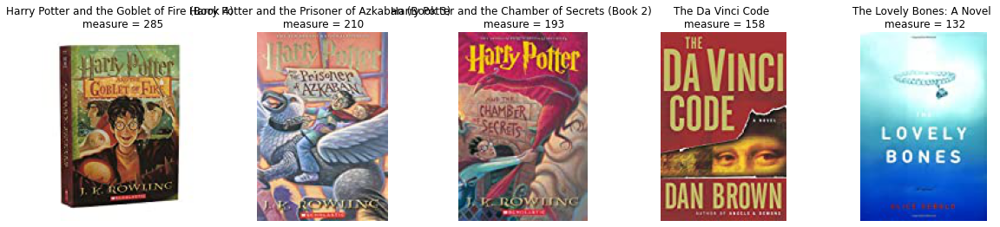

In [35]:
cooc_rec.get_rec(4233)

Для книги


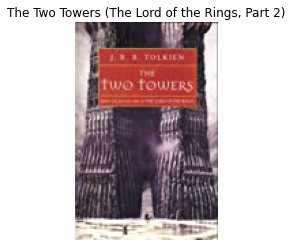

Такие рекомендации


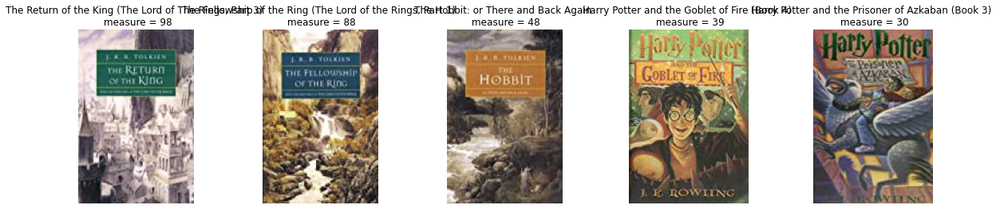

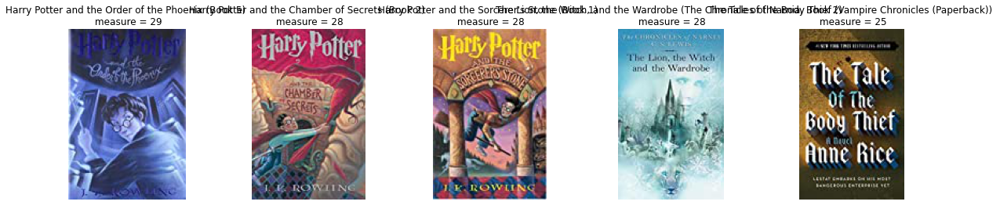

In [36]:
cooc_rec.get_rec(7165)

# Коллаборативная фильтрация

In [37]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import tqdm
import re
from lightfm import LightFM
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds

In [38]:
books = pd.read_csv("BX-Books.csv")
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")
interactions = interactions[interactions["Book-Rating"] != 0]
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])

In [39]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict,name_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    names = [name_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("{} \nmeasure = {}".format(names[cnt][0:20],np.round(measure[cnt], 4)))
                cnt += 1
            else:
                a.title.set_text("{}".format(names[cnt][0:20]))
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [40]:
class Colloborative():
    def __init__(self, interactions):
        self.interactions=interactions
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[int(i)] = j
        df_weights = pd.DataFrame({"Book-Rating": [1,2,3,4,5,6,7,8,9,10],
                                   'weight': [1,2,3,4,5,6,7,8,9,10]})
        weighted = interactions.merge(df_weights, on="Book-Rating")\
                          .groupby(["vid", "product_id", "picture_url"])["weight"]\
                          .sum()\
                          .reset_index()
        self.csr_rates = coo_matrix((weighted["weight"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"]))))
        from tqdm import tqdm_notebook
        self.mat=csr_rates.toarray()
        self.l1=len(self.mat)
        self.l2=len(self.mat[0])
        user_medium=[]
        for i in tqdm_notebook(range(0,self.l1)):
           user_medium.append([])
           for j in range(0,self.l2):
              if self.mat[i][j]!=0:
                 user_medium[i].append(self.mat[i][j])
        massive_list=[]
        for i in tqdm_notebook(user_medium):
           massive_list.append(np.array(i))
        self.means=[]
        for j in tqdm_notebook(massive_list):
           self.means.append(j.mean())
        self.matt=csr_rates.T.toarray()
        book_medium=[]
        for i in tqdm_notebook(range(0,self.l2)):
           book_medium.append([])
           for j in range(0,self.l1):
              if self.matt[i][j]!=0:
                 book_medium[i].append(self.matt[i][j])
        massive_list=[]
        for i in tqdm_notebook(book_medium):
           massive_list.append(np.array(i))
        self.meanst=[]
        for j in tqdm_notebook(massive_list):
           self.meanst.append(j.mean())
        self.inversed_dict = {v: k for k, v in self.content_dict.items()}
        self.name_dict={}
        for i, j in interactions[["product_id", "Book-Title"]].drop_duplicates().values:
            self.name_dict[i] = j
        

    def user_based(self, idx):
        user_rates = self.csr_rates.getrow(idx).toarray()[0]
        watched_items = np.where(user_rates != 0)[0]
        metrics = cosine_similarity([user_rates], self.csr_rates).reshape(-1, 1)
        metrics=[p[0] for p in metrics]
        metrics=np.array(metrics)
        final=[]
        s1=sum(self.means)
        for j in tqdm_notebook(range(0,self.l2)):
           temp=0
           for i in range(0,self.l1):
              temp+=(metrics[i]*(self.mat[i][j]-self.means[i]))
           temp=temp/s1
           temp+=self.means[idx]
           final.append(temp)
        final=np.array(final)
        self.get_recU(watched_items, np.arange(self.csr_rates.shape[1])[np.argsort(final)[::-1][:10]],
                    np.sort(final)[::-1][:10])
        
    def item_based(self, idx):
        item_rates = self.csr_rates.getcol(idx).toarray().reshape(1, -1)
        metrics = cosine_similarity(item_rates, self.csr_rates.T).reshape(-1, 1)
        metrics=[p[0] for p in metrics]
        metrics=np.array(metrics)
        final=[]
        s1=sum(self.meanst)
        for j in tqdm_notebook(range(0,self.l2)):
           temp=0
           for i in range(0,self.l2):
              temp+=((metrics[i])*(self.matt[i][j]-self.meanst[i]))
           temp=temp/s1
           temp+=self.meanst[idx]
           final.append(temp)
        final=np.array(final)
        self.get_rec([idx], np.arange(self.csr_rates.shape[1])[np.argsort(final)[::-1][:10]],np.sort(final)[::-1][:10])


    def get_rec(self, watched, recs, measure):
        print(u"Для такой книги")
        rec_imaging([i for i in watched], self.content_dict,self.name_dict)
        print(u"Такие рекомендации")
        rec_imaging([i for i in recs], self.content_dict,self.name_dict, measure)
    def get_recU(self, watched, recs, measure):
        print(u"Для пользователя с такими книгами")
        rec_imaging([i for i in watched], self.content_dict,self.name_dict)
        print(u"Такие рекомендации")
        rec_imaging([i for i in recs], self.content_dict,self.name_dict, measure)
        

In [41]:
clb = Colloborative(interactions)


Для такой книги


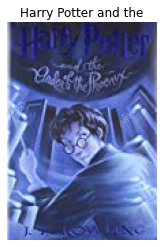

Такие рекомендации


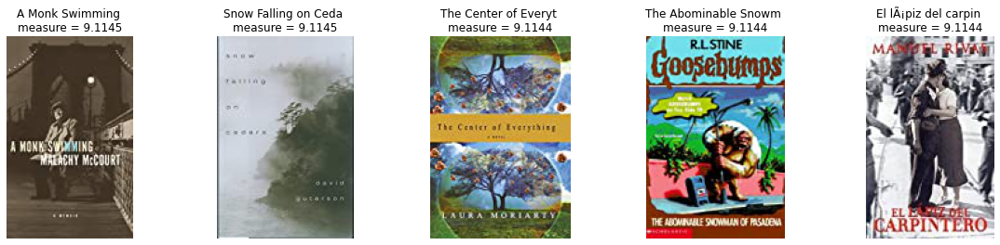

Something went wrong with http://images.amazon.com/images/P/0440419468.01.MZZZZZZZ.jpg


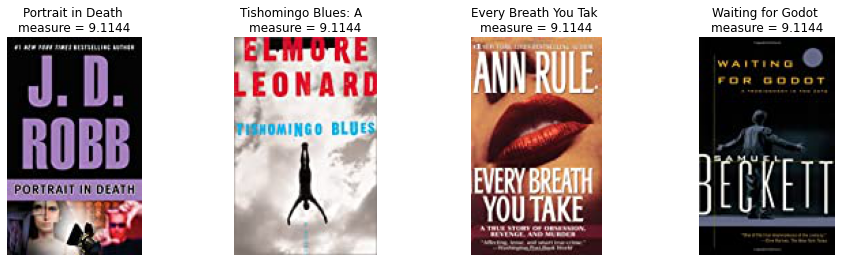

In [42]:
clb.item_based(4233)


Для пользователя с такими книгами


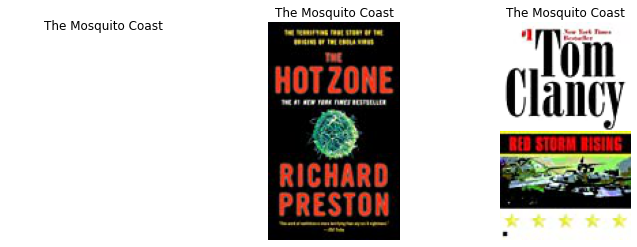

Такие рекомендации


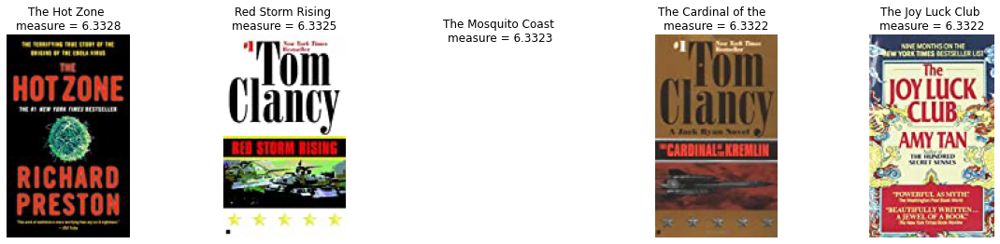

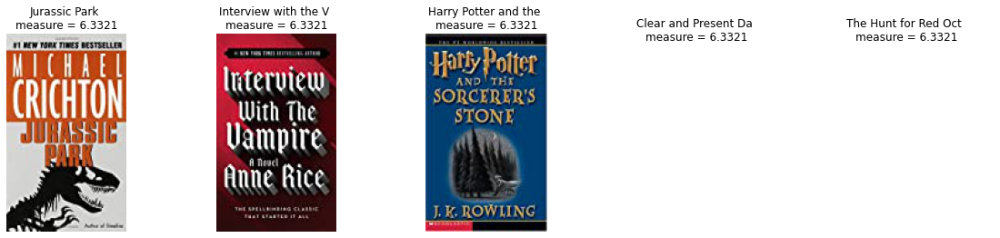

In [43]:
clb.user_based(948)

# Content-based

In [44]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import tqdm
import re
from lightfm import LightFM
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds

In [45]:
books = pd.read_csv("BX-Books.csv")
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")
interactions = interactions[interactions["Book-Rating"] != 0]
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])

In [46]:
for i in range(0,len(books['ISBN'])):
    if "Harry" in books.iloc[i]["Book-Title"]:
        print(i,' ',books.iloc[i]["Book-Title"])

821   The Sorcerer's Companion: A Guide to the Magical World of Harry Potter
2143   Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))
2809   Harry Potter and the Sorcerer's Stone (Book 1)
3459   Harry Potter and the Chamber of Secrets (Book 2)
3839   Harry Potter and the Prisoner of Azkaban (Book 3)
5431   Harry Potter and the Goblet of Fire (Book 4)
5432   Harry Potter and the Chamber of Secrets (Book 2)
5506   Harry Potter and the Order of the Phoenix (Book 5)
6330   Harry Potter and the Prisoner of Azkaban (Book 3)
6657   The Black Echo (Detective Harry Bosch Mysteries)
6932   Harry Potter and the Goblet of Fire (Book 4)
9026   Harry Potter and the Sorcerer's Stone (Book 1)
9057   Cooking for Harry : A Low-Carbohydrate Novel
9169   Angels Flight (Detective Harry Bosch Mysteries)
10440   Harry Potter and the Chamber of Secrets (Book 2)
11254   The Concrete Blonde (A Harry Bosch Novel)
11774   Angels Flight (Detective Harry Bosch Mysteries)
12075   Harry Potter Et LA Co

114217   Diana's Boys: William and Harry and the Mother They Loved
114767   The Concrete Blonde (Detective Harry Bosch Mysteries)
115255   Horrible Harry And The Green Slime
115635   Off the record: The private papers of Harry S. Truman
117012   Angels Flight (Detective Harry Bosch Mysteries)
122104   And God Bless Uncle Harry and His Roommate Jack Who We Are Not Supposed to Talk About
122722   Harry Enfield and His Humor Chums
123087   Dear Bess: The Letters from Harry to Bess Truman, 1910-1959
123702   A Song for Uncle Harry
124502   A Conspiracy of Crowns: The True Story of the Duke of Windsor and the Murder of Sir Harry Oakes
125449   Harry S. Truman and the Modern American Presidency
125900   The Trouble With Harry
128672   What Harry Saw
130360   Wild About Harry
132997   Harry Potter et le prisonnier d'Azkaban
133283   Harry's Dog
134244   Horrible Harry's Secret (Horrible Harry)
135672   Harry Potter y la camara secreta
136176   Harry Potter. Magisches Tagebuch. Ausgabe grÃ?Â¼n

In [47]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i[0])
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i[0]))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("{} \n measure = {}".format(i[1],np.round(measure[cnt], 4)))
                cnt += 1
            else:
                a.title.set_text("{}".format(i[1]))
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [48]:
class Content_Based():
    def __init__(self, items, interactions):
        self.items = items
        self.interactions = interactions
        self.content_dict = {}
        self.extra_dict={}
        for i, j in enumerate(items["Image-URL-M"]):
            self.content_dict[i] = j
        for i, j in enumerate(items["Image-URL-M"]):
           self.extra_dict[i] = [j,'str']
        for i, j in enumerate(items["Book-Title"]):
           self.extra_dict[i][1]=j
        self.inversed_dict = {v: k for k, v in self.content_dict.items()}
        
    def avg_feature_vector(self, words, model, num_features, index2word_set):
        feature_vec = np.zeros((num_features, ), dtype='float32')
        n_words = 0
        for word in words:
            if word in index2word_set:
                n_words += 1
                feature_vec = np.add(feature_vec, model.wv[word])
        if (n_words > 0):
            feature_vec = feature_vec / n_words
        return feature_vec

    def get_items_representation(self):
        item_description = [gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", i.lower())) 
                            for i in self.items['Book-Title']]
        #build vocabulary and train model
        self.model = gensim.models.Word2Vec(
                item_description,
                size=200,
                window=10,
                min_count=1,
                workers=10,
                iter=100)
        self.index2word_set = set(self.model.wv.index2word)
        self.items_embs = np.zeros((len(item_description), 200))
        for i in range(self.items_embs.shape[0]):
            self.items_embs[i] = self.avg_feature_vector(item_description[i], self.model, 200, self.index2word_set)
        
        
    def get_rec_I2I(self, i):
        metrics = cosine_similarity([self.items_embs[i]], self.items_embs)
        print(u"Для книги")
        rec_imaging([i], self.extra_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:11], self.extra_dict, np.sort(metrics)[0][::-1][1:11])


    def get_rec_U2I(self, i):
        ui = self.interactions[self.interactions["vid"] == i]
        user_vector = " ".join(ui["Book-Title"])
        user_processed = gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", user_vector.lower()))
        user_emb = self.avg_feature_vector(user_processed, self.model, 200, self.index2word_set)
        metrics = cosine_similarity([user_emb], self.items_embs)
        print(u"Для пользователя, который взаимодействовал с книгой")
        rec_imaging(np.unique([self.inversed_dict[i] for i in ui["picture_url"]]), self.extra_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:11], self.extra_dict, np.sort(metrics)[0][::-1][1:11])

In [49]:
CB = Content_Based(books, interactions)
CB.get_items_representation()

Для книги


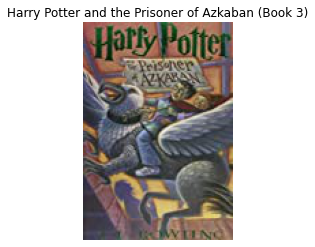

Такие рекомендации


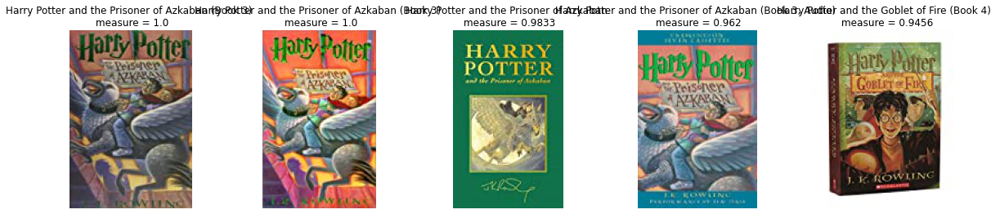

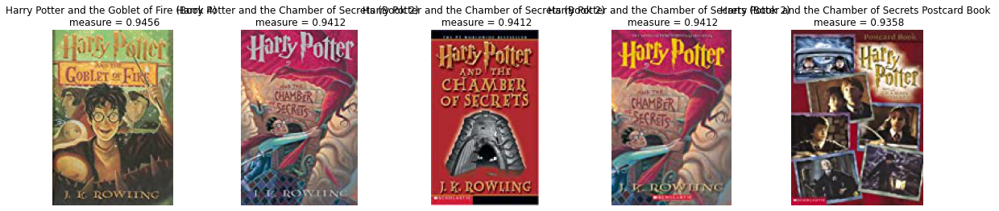

In [50]:
CB.get_rec_I2I(3839)

Для пользователя, который взаимодействовал с книгой


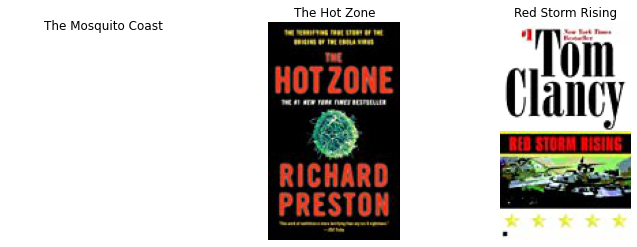

Такие рекомендации


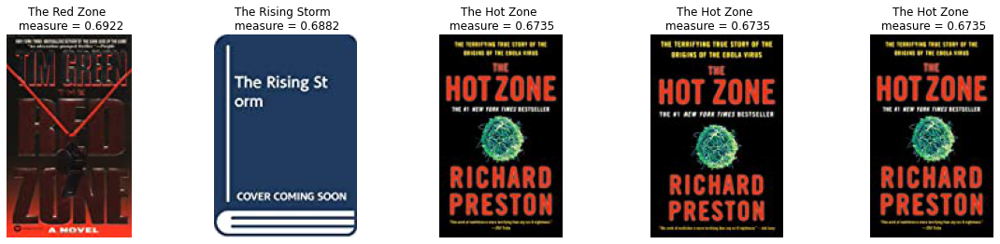

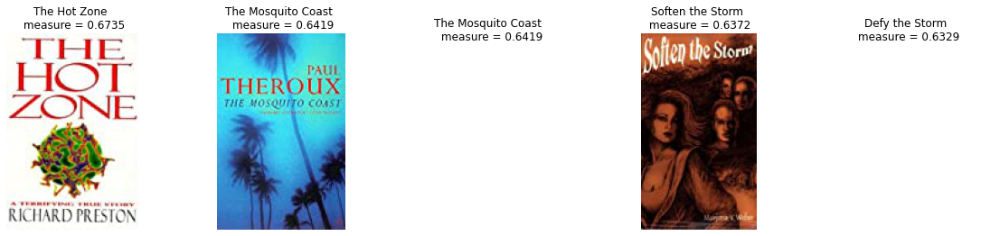

In [51]:
CB.get_rec_U2I(948)

# Матричная факторизация

In [52]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import tqdm
import re
from lightfm import LightFM
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds

In [53]:
books = pd.read_csv("BX-Books.csv")
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")
interactions = interactions[interactions["Book-Rating"] != 0]
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])

In [54]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict,name_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    names = [name_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("{} \nmeasure = {}".format(names[cnt][0:20],np.round(measure[cnt], 4)))
                cnt += 1
            else:
                a.title.set_text("{}".format(names[cnt][0:20]))
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [55]:
class MatrixFactorization():
    
    def __init__(self, items, interactions, k):
        self.interactions=interactions
        self.items = items
        interactions["product_id"] = interactions["product_id"].astype(int)
        self.k = k
        self.content_dict = {}
        self.name_dict={}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[i] = j
        for i, j in interactions[["product_id", "Book-Title"]].drop_duplicates().values:
            self.name_dict[i] = j
        df_weights = pd.DataFrame({"Book-Rating": [1,2,3,4,5,6,7,8,9,10],
                                   'weight': [1, 2, 3,4,5,6,7,8,9,10]})
        weighted = interactions.merge(df_weights, on="Book-Rating")\
                          .groupby(["vid", "product_id", "picture_url"])["weight"]\
                          .sum()\
                          .reset_index()
        weighted["weight"] = (weighted["weight"] > 0).astype(int)
        self.csr_rates = coo_matrix((weighted["weight"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"]))))
        self.inversed_dict = {v: k for k, v in self.content_dict.items()}
        
    def MF(self):
        U, S, V = svds(self.csr_rates.astype(float), k=self.k)
        self.user_embs = U
        self.items_embs = V.T
        
    def LightFM(self):
        self.model = LightFM(loss='warp', no_components=100, learning_rate=0.03, learning_schedule="adadelta")
        self.model.fit(self.csr_rates, epochs=5, num_threads=40, verbose=True)
        self.user_feature_bias, self.user_feature_embeddings = self.model.get_user_representations()
        self.item_feature_bias, self.items_embs = self.model.get_item_representations()
        

    def get_rec(self, i):
        metrics = cosine_similarity([self.items_embs[i]], self.items_embs)
        print(u"Для книги")
        rec_imaging([i], self.content_dict,self.name_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(-metrics)[0][1:11], self.content_dict, self.name_dict, -np.round(np.sort(-metrics)[0][1:11], 4))
        
    def get_recU(self, i):
        metrics = cosine_similarity([self.user_embs[i]], self.user_embs)
        ui = self.interactions[self.interactions["vid"] == i]
        print(u"Для пользователя, взаимодействовавшего с книгами")
        rec_imaging(np.unique([self.inversed_dict[i] for i in ui["picture_url"]]), self.content_dict,self.name_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(-metrics)[0][1:11], self.content_dict,self.name_dict, -np.round(np.sort(-metrics)[0][1:11], 4))

In [56]:
simple_svd = MatrixFactorization(books, interactions, 30)
simple_svd.MF()

Для книги


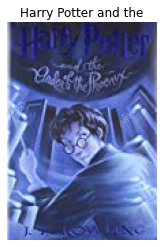

Такие рекомендации


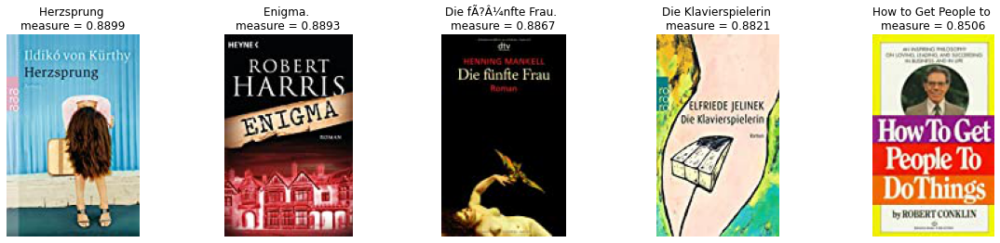

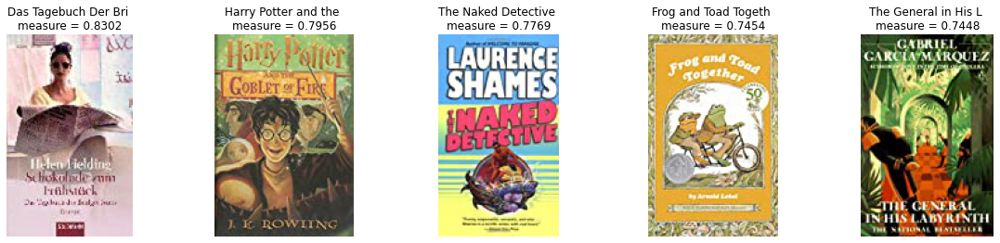

In [57]:
simple_svd.get_rec(4233)

Для пользователя, взаимодействовавшего с книгами


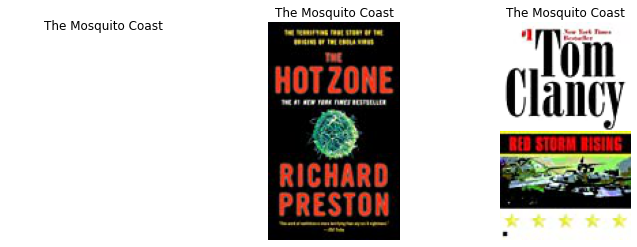

Такие рекомендации


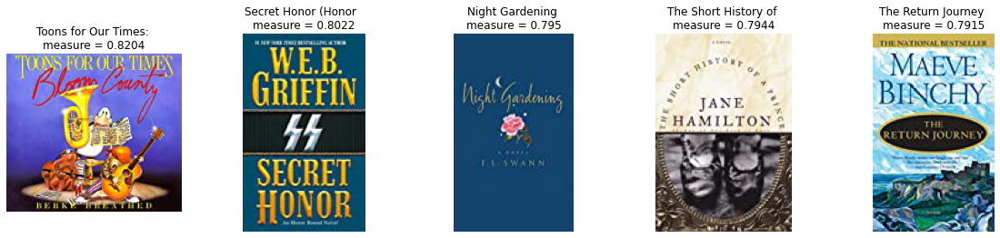

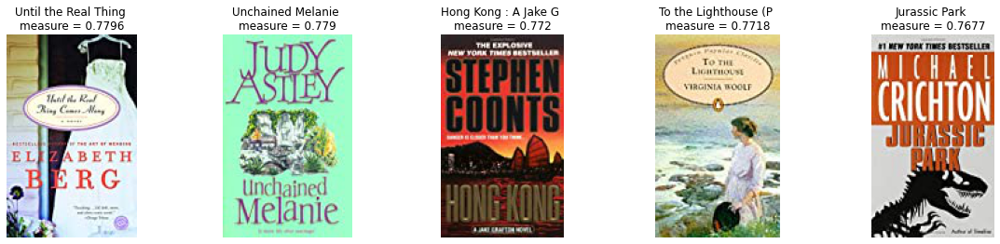

In [58]:
simple_svd.get_recU(948)